# Intro

This notebook provides a descriptive analysis of behavior and walks through observations that contextualize later analysis. As in the `Data Cleaning` notebook, the emphasis will be on the pushes instead of the continuous variables.

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
import logging

from foraging.plotting import bp, per_block, enhanced_violinplot, subject_plotter
from foraging.utils.data import filter_df, display_df, get_blocks, bin_data, process_blocks, extend_df
from foraging.config.constants import BOX_COLORS, BOX_LABELS, KAPPA_LEVELS, SEED
from foraging.plotting import PALETTE, PALETTE_DARK

import matplotlib.pyplot as plt
from matplotlib import rcParams
import numpy as np
import pandas as pd
import seaborn as sns
from functools import partial

# Filter out annoying matplotlib logs
mlogger = logging.getLogger('matplotlib')
mlogger.setLevel(logging.WARNING)

# Constants
RNG = np.random.default_rng(SEED)
DATA_DIR = '../../data'
FIGURES_DIR = '../../figures'

# Modify the default kappa levels once
KAPPA_LEVELS['viktor'] = {
    'low': [0.01],
    'high': [0.1, 0.2]
}


2025-06-16 22:53:38,156 - numexpr.utils - INFO - Note: NumExpr detected 20 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 16.
2025-06-16 22:53:38,157 - numexpr.utils - INFO - NumExpr defaulting to 16 threads.


# Load Data

The experiment data consists of multiple matfiles corresponding to the data for different subjects. Each matfile contains that subject's push, eye tracking (if available), and position (if available) data organized by blocks and sessions. Each block corresponds to a set of experiment parameters, notably the schedule of each box, the stimulus reliability kappa, and the stimulus type. A hierarchical overview of a given matfile is given in the `Data Cleaning` notebook.

Here is a DataFrame showing a subset of the data, after applying the exclusion criteria detailed in `Data Cleaning`. Refer to the docstring of `make_df` and `exclusion_criteria` for more information about the contents of the DataFrame.

In [2]:
from foraging.utils.data import make_df, exclusion_criteria

df = make_df(os.path.join(DATA_DIR, 'experiments'))
df = exclusion_criteria(df)
df = df.xs(1, level = 'shape', drop_level = False)

# Remove some unnecessary blocks
df = df.drop(
    get_blocks(df[(df["schedule"] == 30) | (df["schedule"] == 7)]).size().index
)

display_df(df, ["box", "push times", "reward outcomes"])

|                                                               | box    |   push times | reward outcomes   |
|:--------------------------------------------------------------|:-------|-------------:|:------------------|
| ('dylan', 20211206, 2, 1, 'probability', 1, 'high', 0.1, 'M') | slow   |        3.135 | False             |
| ('dylan', 20211206, 2, 2, 'probability', 1, 'high', 0.1, 'M') | fast   |        8.465 | False             |
| ('dylan', 20211206, 2, 3, 'probability', 1, 'high', 0.1, 'M') | fast   |        9.468 | False             |
| ('dylan', 20211206, 2, 4, 'probability', 1, 'high', 0.1, 'M') | fast   |       11.667 | False             |
| ('dylan', 20211206, 2, 5, 'probability', 1, 'high', 0.1, 'M') | medium |       17.125 | False             |

## Data Overview
A quick overview of the summary statistics:

In [3]:
print("schedules experienced by each subject")
print(df.groupby('subject')['schedule'].unique())

schedules experienced by each subject
subject
dylan     [35.0, 15.0, 21.0]
marco     [35.0, 15.0, 21.0]
viktor    [15.0, 21.0, 35.0]
Name: schedule, dtype: object


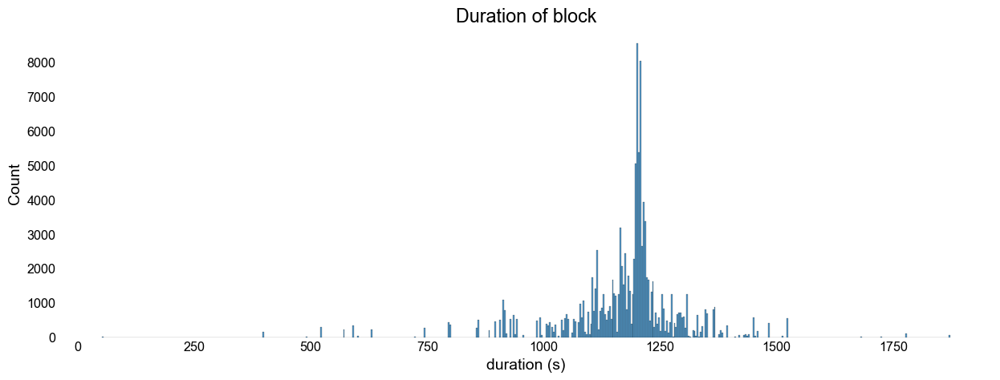

In [4]:
sns.histplot(df, x = 'duration')
plt.title("Duration of block")
plt.xlabel("duration (s)");

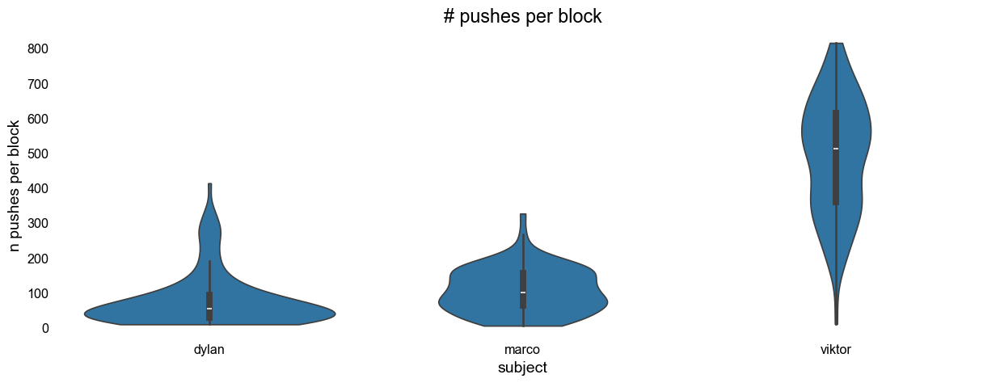

In [5]:
block_summary = df.groupby(['subject', 'session', 'block']).size().reset_index(name='n pushes per block')
sns.violinplot(block_summary, x='subject', y='n pushes per block', cut=0)
plt.title("# pushes per block");

# Explore Data
The behavioral quantities we will explore are: consecutive push intervals, wait times, stay pushes, switch pushes, runlengths of consecutive choices, etc. These are defined as follows:
+ <span style='color:#03a9fc'>consecutive push intervals</span>: time between consecutive pushes.
+ <span style='color:#fa5cbe'>wait times</span>: time between consecutive pushes *at the same box*-- can include pushes made at other boxes during this interval. This is essentially how long the subject has been waiting on this box to be ready before they push at that box again.
+ <span style='color:#fa0c9f'>stay times</span>: the intersection of consecutive push intervals and wait times, which occurs when the subject chooses to stay at their current box and push again.
+ <span style='color:#22c793'>switch times</span>: the time between consecutive pushes at different boxes, which will largely capture travel time between equidistant boxes.
+ <span style='color:#ff9d00'>runlengths</span>: the number of times the subject pushes the same box before switching boxes.

One hypothesis we would like to test is whether the subjects' wait times obey the matching law, which is a normative principle that states that how often an option is picked is proportional to the reward they give. For example, a box with a faster mean schedule should be visited more frequently than a slower box. A good discussion of when matching is the result of theoretically optimal decision-making can be found in [(Sakai & Fukai 2008)](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0003795). In our study, the matching law should materialize as the reward rates being proportional to the visit frequencies of each box; since each box has a different mean schedule, then, in expectation, the wait times for a given box should be proportional to the mean schedules of that box.

## Example Block

Here we show activity in an example block unfolding over time. Blue = fast box, yellow = medium box, red = slow box. Filled markers indicate rewarded pushes, unfilled unrewarded.

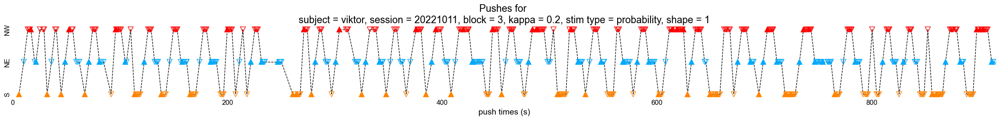

In [6]:
from foraging.plotting.behavior import plot_pushes

conds = dict(subject='viktor', session=20221011, block=3)
plot_pushes(df, conds, fig_kwargs=dict(figsize=(30,2.2)), legend = False);

## Pushes

Here is an overview of the statistics of the pushes for each subject.

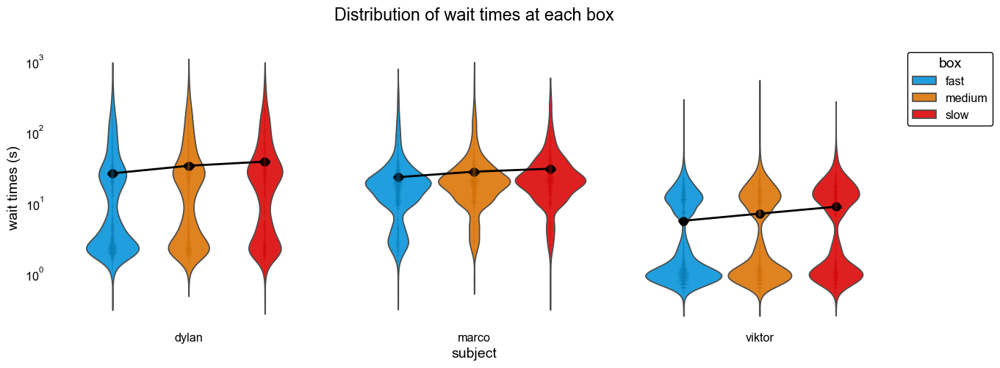

In [7]:
fig, ax = plt.subplots()
bp(sns.swarmplot)(df.groupby('subject').sample(10000, random_state=SEED, replace=True), x='subject',
                  y='wait times', hue='box', palette=PALETTE_DARK, legend=False, log_scale=True, size=0.25,
                  dodge=True, ax=ax)
bp(enhanced_violinplot)(df, x='subject', y='wait times', hue='box', palette=PALETTE,
                        title_prefix="Distribution of wait times at each box", y_unit='s', cut=0, inner=None,
                        log_scale=True, common_norm=True, ax=ax);

Here are the distributions of wait times at each box as a function of stimulus reliability.

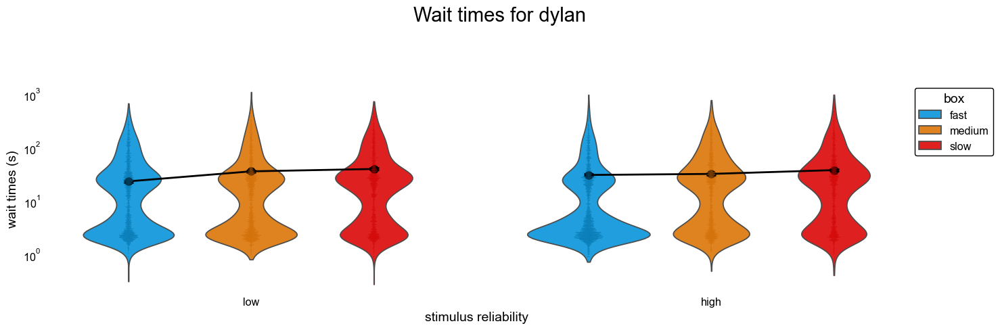

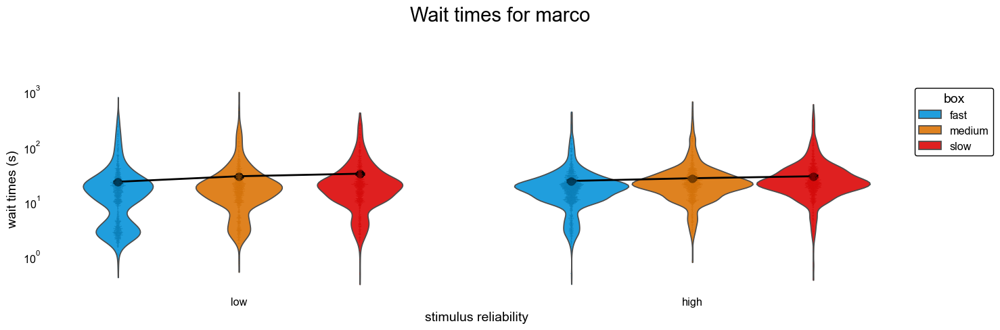

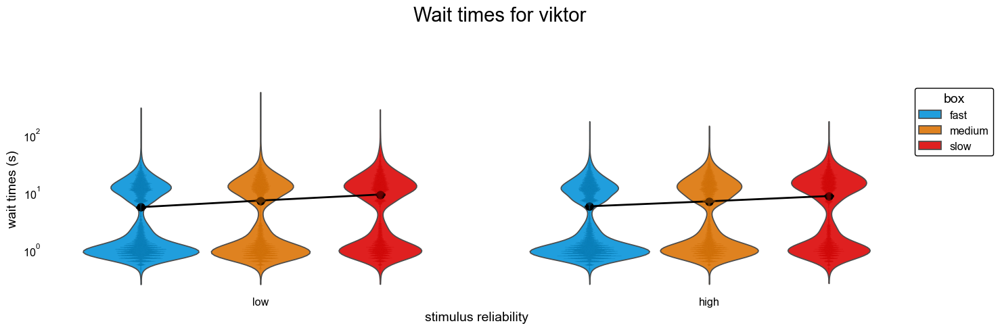

In [8]:
from foraging.plotting.behavior import plot_wait_times

plot_wait_times(df, subj_kwargs = {'viktor': dict(swarm_kwargs = dict(size = 0.25))})

There is a striking bimodality in the wait time distributions that is preserved across subjects-- there is a fast mode and a slow mode. 

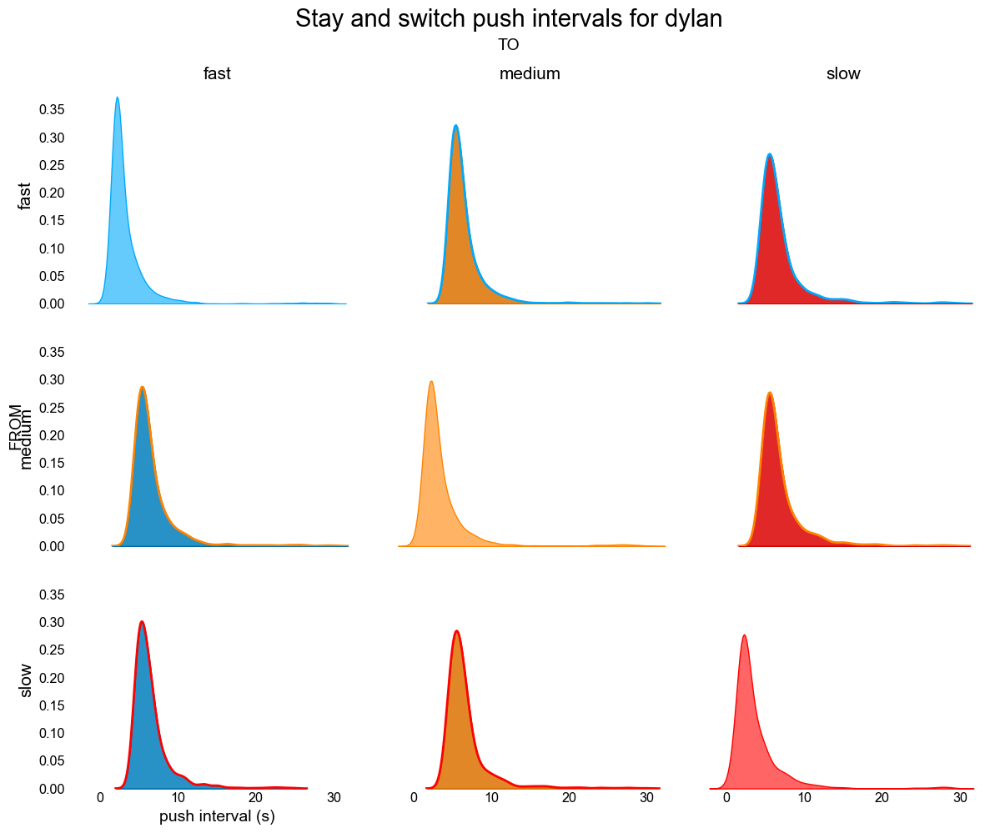

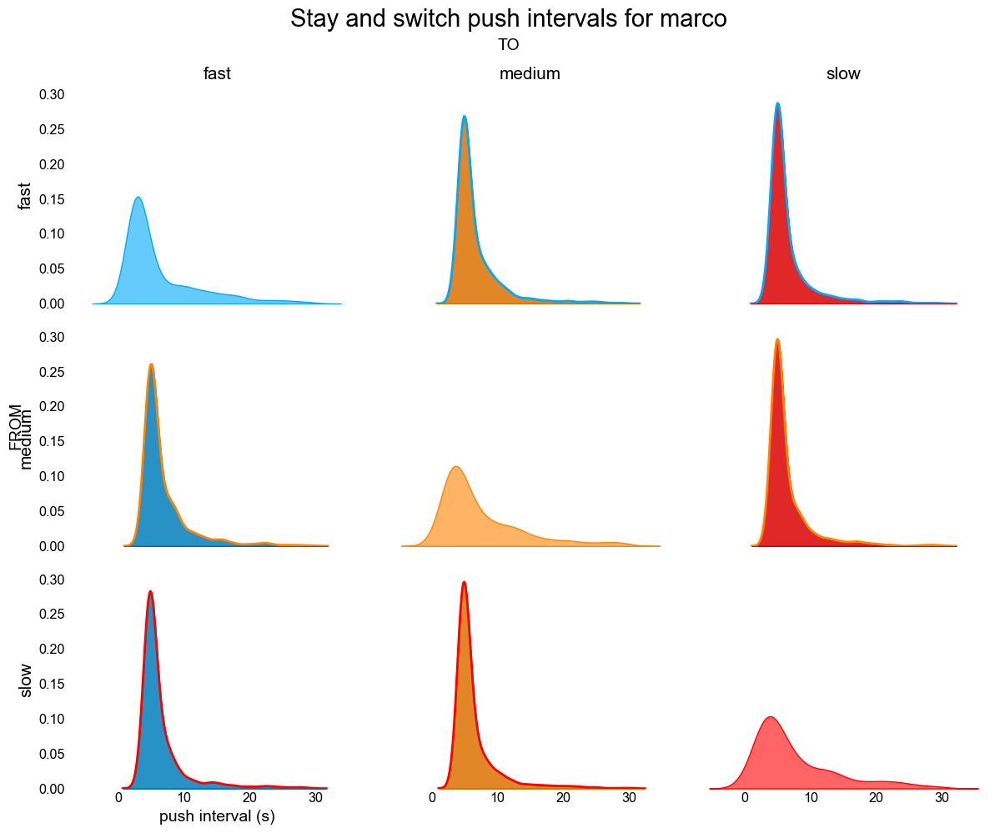

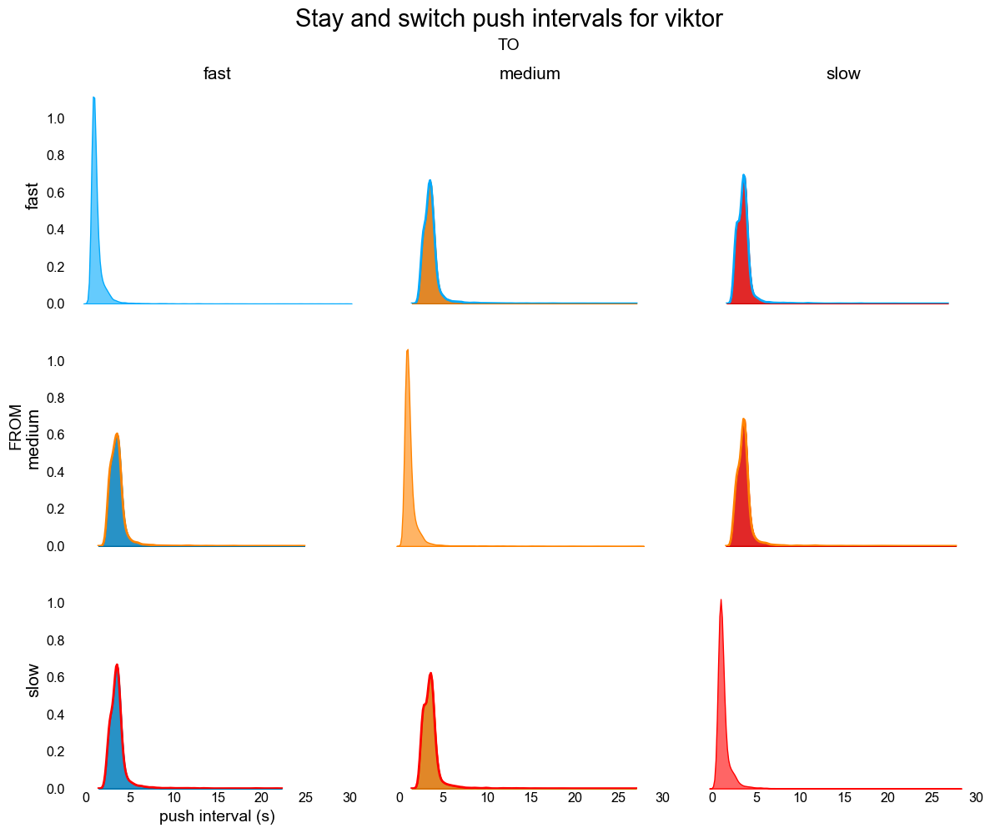

In [9]:
from foraging.plotting.behavior import plot_stay_switch_pushes
plot_stay_switch_pushes(df)

First, for Dylan, the switch times and stay times are remarkably similar across all pairs of boxes. Generally speaking, for each subject the switch times are qualitatively similar, suggesting that most of the time spent pushing different boxes is travel time.  Second, for each subject, the stay times look qualitatively similar to each other as well.

Finally, the distribution of consecutive push intervals can reveal the complexity of the decision process-- for example, suppose the decision space is {push at $\text{box}_i$ , wait}, and each timestep the animal makes a decision whether and where to push. Then, ignoring travel cost, a simple Hidden Markov Model (HMM) of this decision process would result in exponentially distributed intervals between pushes. Fitting an exponential distribution to each empirical distribution via maximum likelihood estimation and then performing a Kolmogorov-Smirnoff test under the null hypothesis that the data is drawn from the fitted exponential distributions resulted in rejecting the null hypothesis in each case, so the push intervals are likely the result of a much more complicated decision process.


### Runlengths
To get a sense of the statistics of *sequences* of pushes, we can gather the runlengths, that is the number of consecutive pushes at the same box before the subject switches.

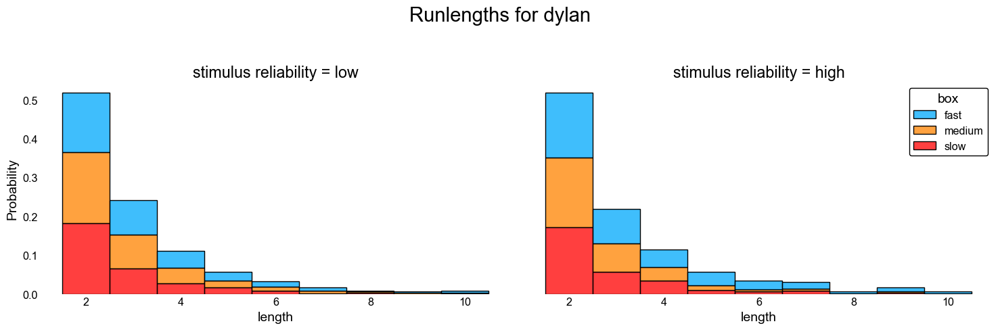

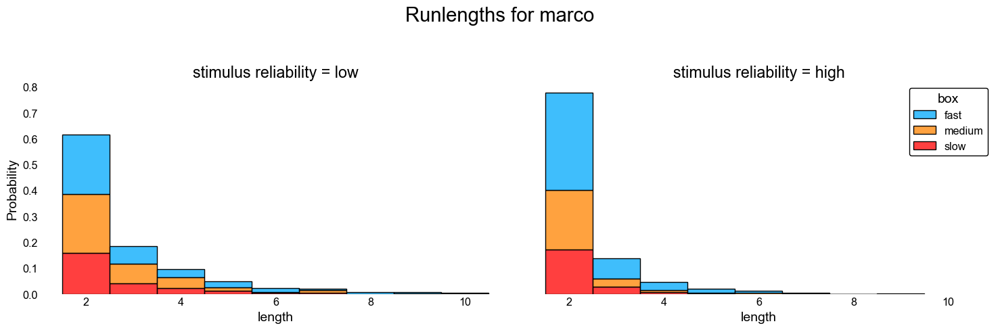

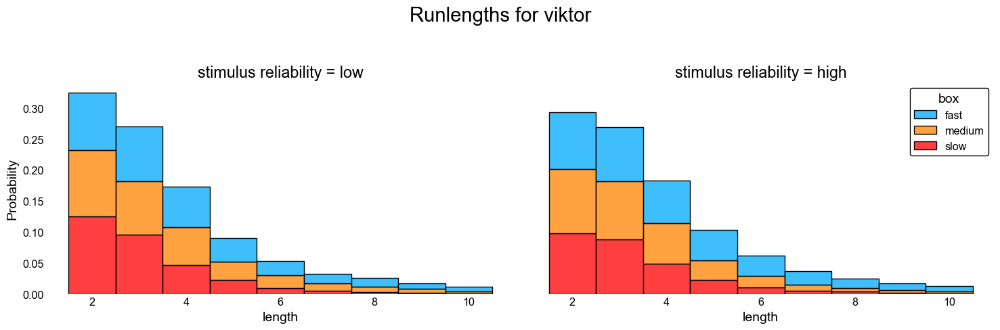

In [10]:
from foraging.plotting.behavior import plot_runlengths

plot_runlengths(df, stat = 'probability')

Aside from fitting in slightly more pushes at the fast box before switching when the reliability is high, there isn't much difference in runlengths between reliabilities.

### Wait Times vs Reward Times

Here, we show each wait time along with the reward interval of the box that was pushed. Basically, we want to see how well the subjects timed their pushes to the reward interval of the box. Our expectation is that as the stimulus reliability increases, the subjects should be able to time their pushes more reliably to occur after the reward interval has elapsed.

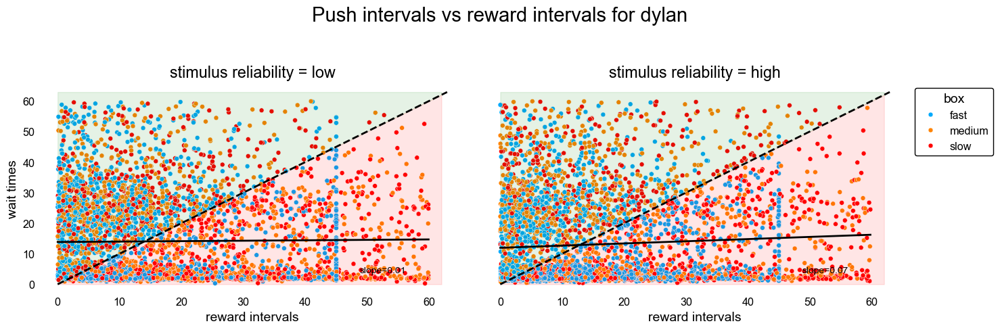

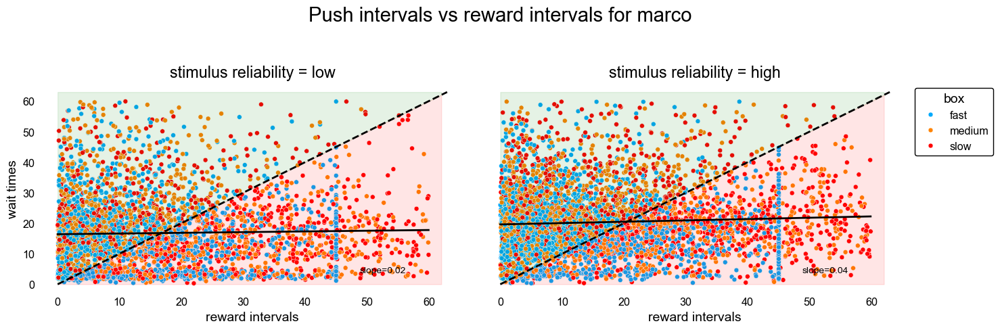

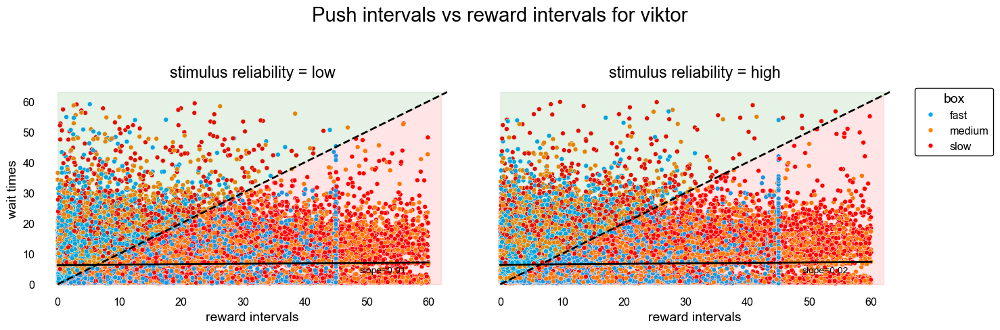

In [11]:
from foraging.plotting.behavior import plot_push_intervals_vs_reward_intervals

plot_push_intervals_vs_reward_intervals(filter_df(df[(df['wait times'] < 60) & (df['reward intervals'] < 60)]), annotate_reg=True)

Contrary to expectations, there appears to be no correlation between the wait times and reward intervals under any reliability conditions.

### Surprise

We can ask how much the factor of "surprise" at a particular reward outcome influences future behavior. For example, if the subject waits a long time and still doesn't get reward, they might 1) switch boxes and 2) wait longer to push the box they left if they start to believe it's a slower box. 

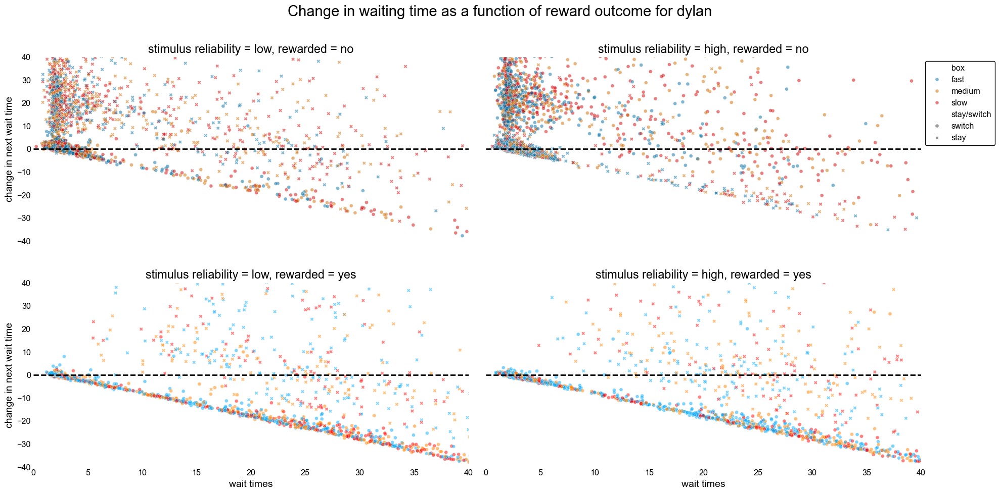

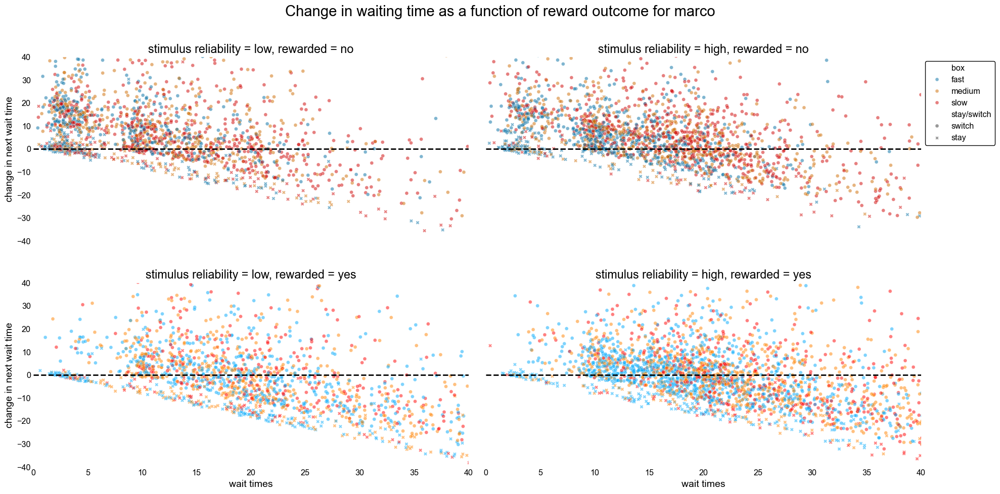

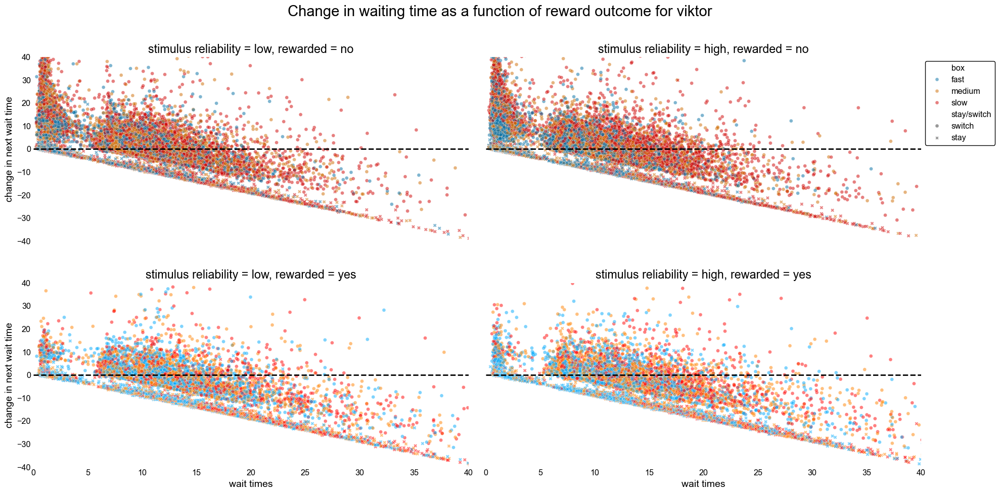

In [12]:
%%capture --no-display
from foraging.plotting.behavior import plot_next_push_surprise

plot_next_push_surprise(df, fig_kwargs = dict(figsize = (20, 10)), legend_kwargs = dict(loc="upper left", bbox_to_anchor = (1,1), title = None))

Across both rewarded and unrewarded cases, there is a transition point at 20-25 s between waiting longer and going sooner the next push that is roughly preserved across all conditions. As reliability increases, the wait time on the x-axis clusters by boxes better and better. There is a distinct string of stay pushes that occur near the bottom of the graph where the subject pushes a few seconds after the current push. Visually, it appears that the subject switches a lot more across both reward outcomes, possibly switching more the longer they've waited, but when choosing to stay and push again, does so more after being rewarded. We confirm this below by counting how many times they stay or switch depending on how long they waited and the reward outcome.

### Probability of staying

Here we calculate the probability of staying and pushing the same box again as a function of waiting time. We do this separately for the rewarded and unrewarded case.

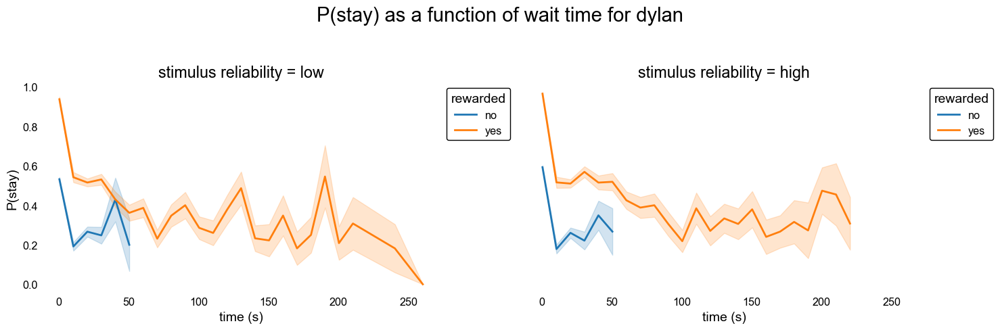

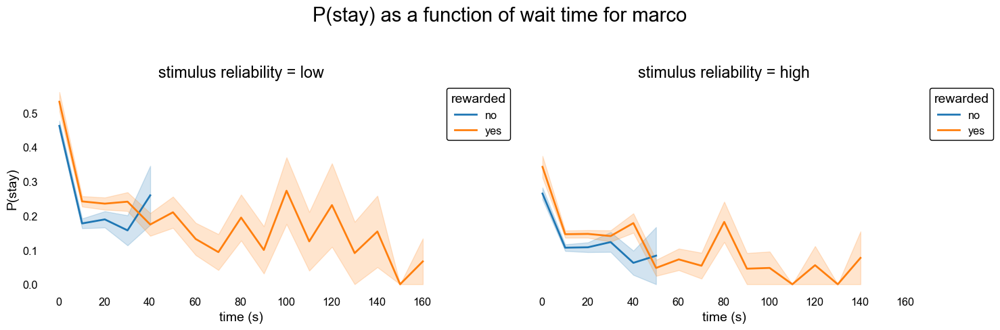

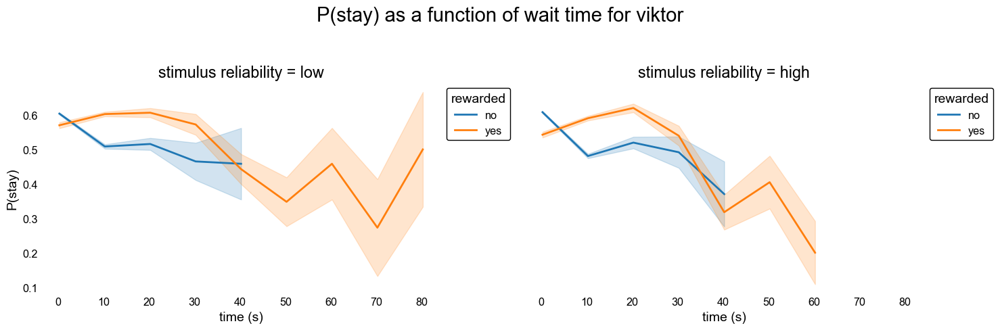

In [13]:
%%capture --no-display
from foraging.plotting.behavior import plot_stay_probabilities

plot_stay_probabilities(df, min_obs = 10)

Clearly, the probability of staying is greater after receiving reward, but it generally goes down the longer the subject waits, with the exception of some weird quirks that could be due to low data volume. Tentatively, it even looks like the probability of staying grows more similar between reward outcomes as the subject waits longer.

## Block Dynamics

In this section, we explore how behavioral variables, such as reward rate and push frequency, evolve over time in the block. We will also compare to the optimal reward rate possible, if the subject were able to get each reward as soon as it became available. This is equal to the inverse mean schedules, and under independence of boxes and negligible travel costs, the sum of their individual reward rates yields the total reward rate.

### Reward Rate

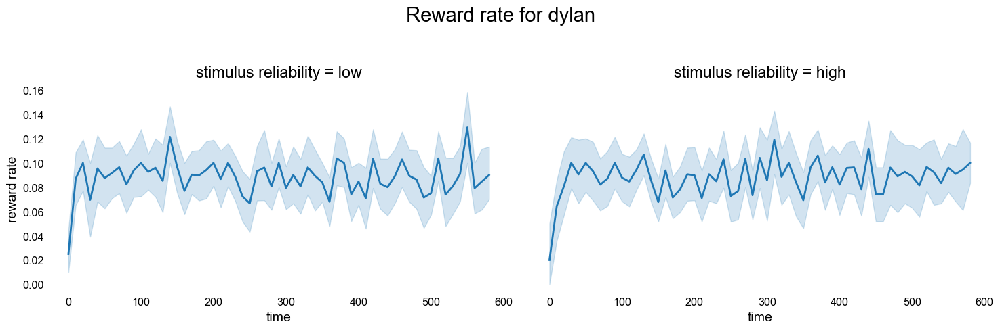

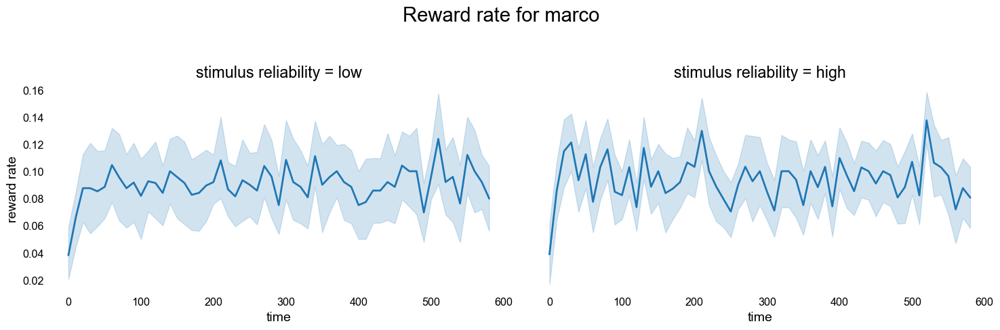

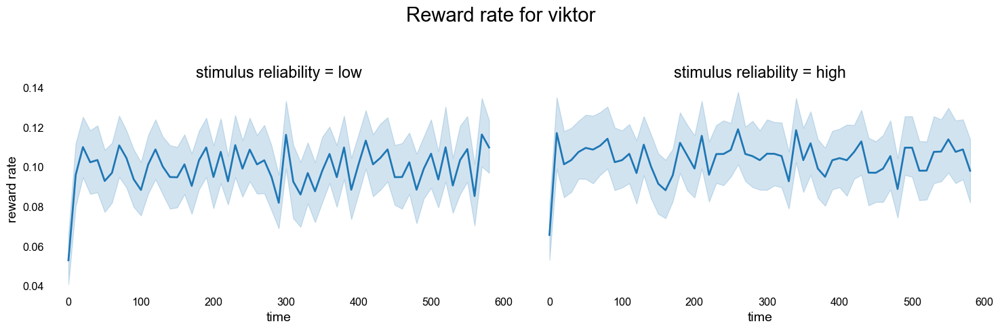

In [14]:
%%capture --no-display
from foraging.plotting.behavior import plot_reward_rates_across_blocks

plot_reward_rates_across_blocks(df, bin_kwargs = dict(bins = list(range(0, 60, 10)) + list(range(60, 600, 10))))

The reward rates are very similar across subjects, starting off low and then increasing to a steady state that is not all that different from the gamma schedule! It is possible that even under this flawed paradigm, the subjects are still reaching a target reward rate.

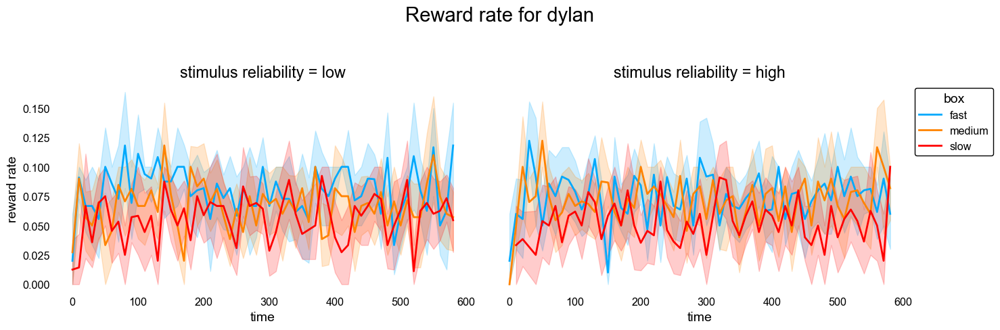

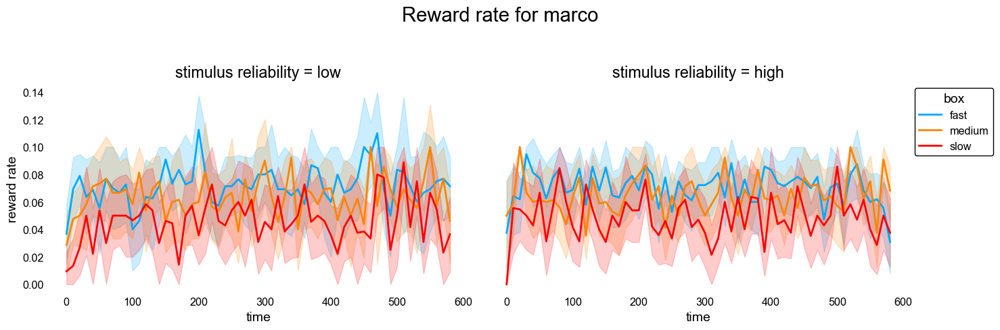

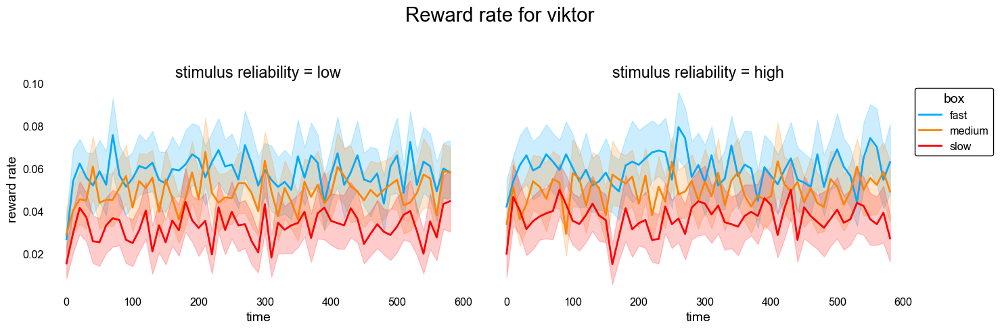

In [15]:
%%capture --no-display
plot_reward_rates_across_blocks(df, by_box = True, bin_kwargs = dict(bins = list(range(0, 60, 10)) + list(range(60, 600, 10))), min_obs = 5)

The reward rates are similar across boxes, with a very slight ordering going fast > medium > slow.

### Wait Time

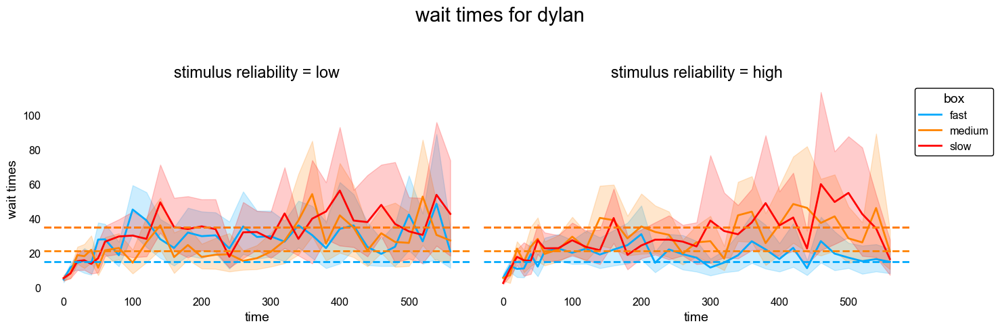

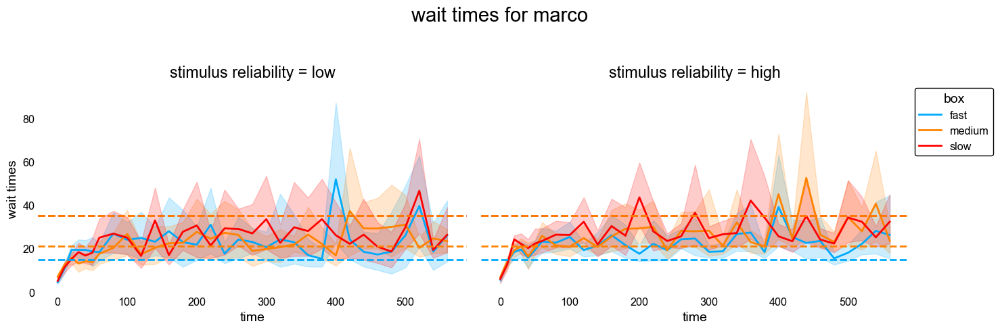

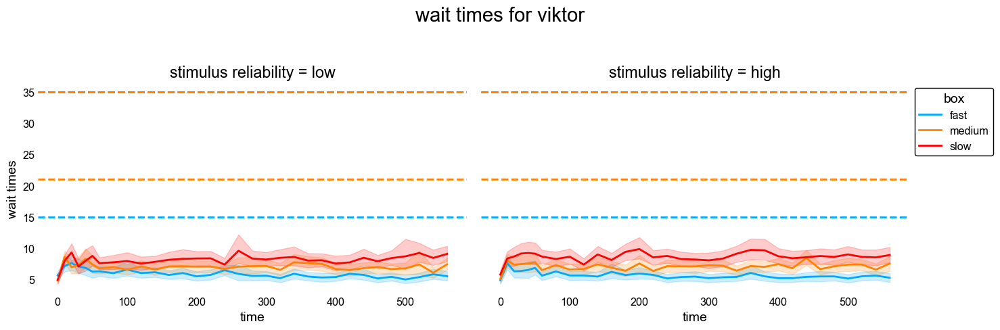

In [16]:
%%capture --no-display
from foraging.plotting.behavior import plot_quantity_in_block

def _auxiliary_plot(df: pd.DataFrame, conds: dict = None, palette: dict = None, ax: plt.Axes = None, **kwargs):
    df_conds = filter_df(df, conds)
    schedules = filter_df(df, {'stimulus reliability': 'high', 'subject': 'viktor'})[['box', 'schedule']].value_counts().index.tolist()
    for (box, schedule) in schedules:
        ax.axhline(schedule, color = palette[box], linestyle = '--')

plot_quantity_in_block(df, y = 'wait times', bin_kwargs = dict(bins = list(range(0, 60, 10)) + list(range(60, 600, 20))), auxiliary_plot = _auxiliary_plot, min_obs = 5)

Interestingly enough, it appears that Dylan and Marco do learn to push slower, even if they don't differentiate the boxes, but for Viktor there isn't much difference. Yet, his reward rate is still similar to the other subjects, suggesting that the task may not be challenging enough and that Viktor possibly found a "lazy" strategy that still rewards him as much as the others.

### Matching Law

The matching law is a behavioral principle that states that the number of times an option is picked is proportional to how much reward is received. Formally:

$$ \frac{R_i}{R_1 + R_2 + R_3} \propto \frac{C_i}{C_1 + C_2 + C_3}$$

where $R_i$ and $C_i$ denote the reward and number of times option $i$ has been chosen, respectively. If we consider this to occur in some time window, then $R_i$ and $C_i$ become rates.

Put another way, matching should manifest as the ratio of reward rate and push rate being proportional to the total reward per push across different boxes.

$$ 
\begin{aligned}
\frac{R_i}{C_i} &\propto \frac{R_1 + R_2 + R_3}{C_1 + C_2 + C_3}\\
&\propto \text{total reward per push}
\end{aligned}
$$

Since each push can only earn at max 1 reward, this fraction never exceeds 1 and can be thought of as a measure of "efficiency" or probability of each push receiving reward-- the closer to one this fraction is, the more reward the subject is receiving per push on average. Note that such a metric would struggle to distinguish a cautious policy that waits a fixed, excessively long time to push any box from a smart policy that optimally times pushes according to each box's schedule; in the former, each push has a high probability of being rewarded just due to the passage of time, and the same is true for the latter, where the reward probabilities are completely determined by the wait time and schedule of each box. Thus, the final efficiency metric we shall use will be divided by time, so that we can get the reward per push per unit time. 

$$ 
\begin{aligned}
E_i(\delta_t) &= \frac{R_i}{C_i*\delta_t}\\
&= \text{reward per push per unit time}
\end{aligned}
$$

where $\delta_t$ is the time window to consider the efficiency in. Thus, the max efficiency can be at most $\frac{1}{\delta_t}$.

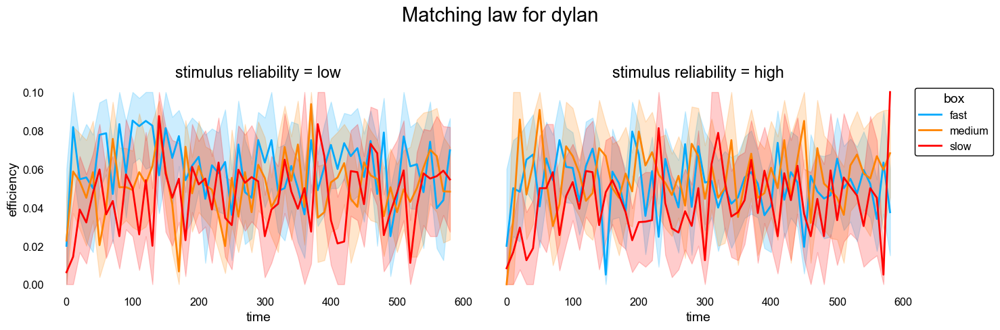

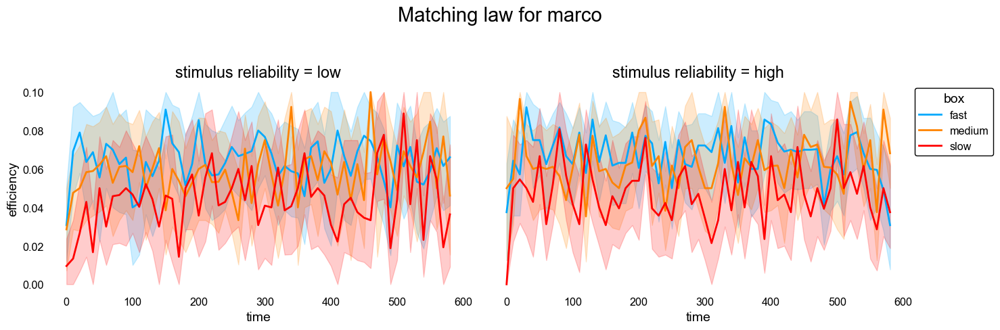

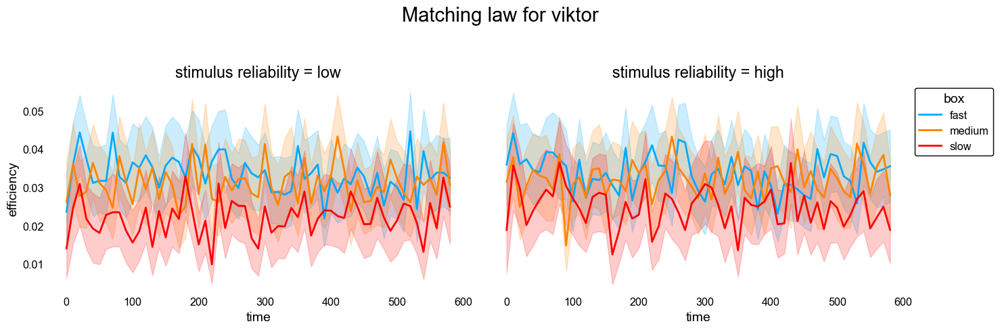

In [17]:
%%capture --no-display
from foraging.plotting.behavior import plot_matching_law

plot_matching_law(df, bin_kwargs = dict(bins = list(range(0, 60, 10)) + list(range(60, 600, 10))))

Here, $\delta_t = 10$. There is no relationship between efficiency and reliability, nor does it seem like the subjects ever achieve a high efficiency at any box.

# Conclusion

To summarize:
+ Varying the reliability has no effect on behavior
+ The subjects fail to or very weakly differentiate how long they wait by the schedule of each box
+ In the first 30 seconds:
  + the subjects have a low reward rate, but as they engage with the task their reward rate rises and stabilizes to ~0.1
+ They are not very efficient with their pushes